# Librerias

In [1]:
# impotamos las librerias necesarias
import pandas as pd
import numpy as np

## opciones de pandas para visualizar todas las columnas 
import warnings
warnings.simplefilter('ignore')

import matplotlib.pyplot as plt
import seaborn as sns

import plotly.express as px 

%matplotlib inline

import sys
sys.path.append('../src')
import suport as sp


pd.set_option('display.max_columns', None)



# librerias scikit-learn para clustering y metricas

from sklearn.cluster import KMeans, AffinityPropagation
from sklearn.metrics import silhouette_score, davies_bouldin_score

from yellowbrick.cluster import KElbowVisualizer

# Preprocesado y modelado
# ==============================================================================
from sklearn.preprocessing import StandardScaler



# Calidad de los clusters
# ==============================================================================
from ds_utils.unsupervised import plot_cluster_cardinality, plot_cluster_magnitude, plot_magnitude_vs_cardinality
from scipy.spatial.distance import euclidean



In [2]:
df = pd.read_csv('../data/Customers.csv') # leemos el archivo csv

#df.columns=[e.lower().replace(' ', '_') for e in df.columns]


df.head()


,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


## Analisis exploratorio

In [3]:
sp.info_df(df)

,column_name,unique,null,%_null,type,count,unique,top,freq,mean,std,min,25%,50%,75%,max
9,income,5694,0,0.0,int64,9134.0,NaN,NaN,NaN,37657.380009,30379.904734,0.0,0.0,33889.5,62320.0,99981.0
2,customer_lifetime_value,8041,0,0.0,float64,9134.0,NaN,NaN,NaN,8004.940475,6870.967608,1898.007675,3994.251794,5780.182197,8962.167041,83325.38119
21,total_claim_amount,5106,0,0.0,float64,9134.0,NaN,NaN,NaN,434.088794,290.500092,0.099007,272.258244,383.945434,547.514839,2893.239678
12,monthly_premium_auto,202,0,0.0,int64,9134.0,NaN,NaN,NaN,93.219291,34.407967,61.0,68.0,83.0,109.0,298.0
14,months_since_policy_inception,100,0,0.0,int64,9134.0,NaN,NaN,NaN,48.064594,27.905991,0.0,24.0,48.0,71.0,99.0
13,months_since_last_claim,36,0,0.0,int64,9134.0,NaN,NaN,NaN,15.097,10.073257,0.0,6.0,14.0,23.0,35.0
16,number_of_policies,9,0,0.0,int64,9134.0,NaN,NaN,NaN,2.96617,2.390182,1.0,1.0,2.0,4.0,9.0
15,number_of_open_complaints,6,0,0.0,int64,9134.0,NaN,NaN,NaN,0.384388,0.910384,0.0,0.0,0.0,0.0,5.0
0,customer,9134,0,0.0,object,9134,9134,BU79786,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,state,5,0,0.0,object,9134,5,California,3150,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [4]:
df.duplicated().sum()

0

## Tratamiento de numericas

In [5]:
df_num = df.select_dtypes(include = np.number )
df_num

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount
0,2763.519279,56274,69,32,5,0,1,384.811147
1,6979.535903,0,94,13,42,0,8,1131.464935
2,12887.431650,48767,108,18,38,0,2,566.472247
3,7645.861827,0,106,18,65,0,7,529.881344
4,2813.692575,43836,73,12,44,0,1,138.130879
...,...,...,...,...,...,...,...,...
9129,23405.987980,71941,73,18,89,0,2,198.234764
9130,3096.511217,21604,79,14,28,0,1,379.200000
9131,8163.890428,0,85,9,37,3,2,790.784983
9132,7524.442436,21941,96,34,3,0,3,691.200000


# Estandarizacion

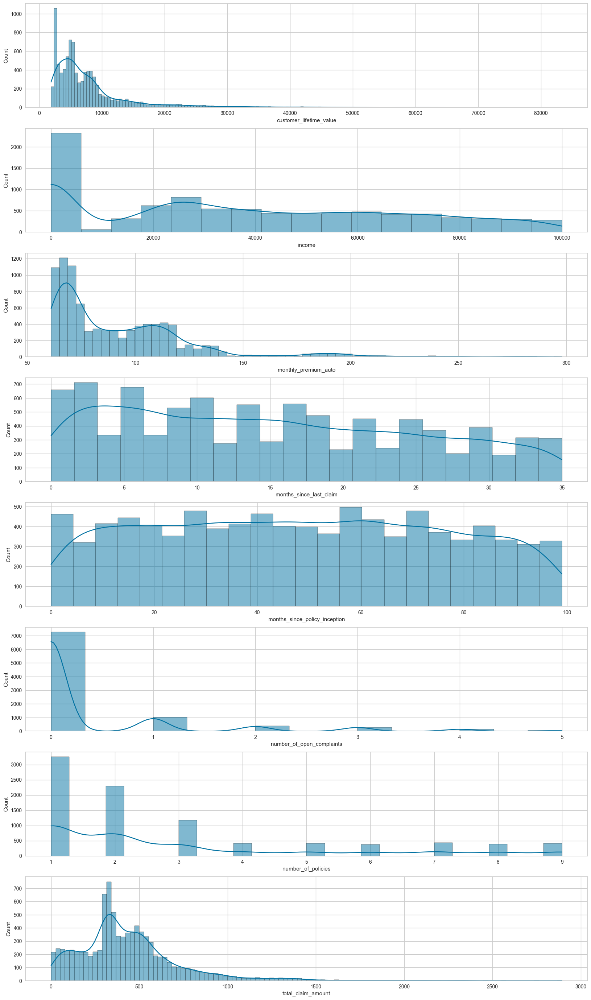

In [6]:
df_num = df.select_dtypes(include = np.number )

columnas = df_num.columns

fig, ax = plt.subplots(8,1, figsize = (20,35))

for i in range(len(columnas)):
    sns.histplot(df_num[columnas[i]], kde = True, ax = ax[i])
plt.show()

In [7]:
df_num.drop('customer_lifetime_value', axis = 1, inplace = True)


In [8]:
sc = StandardScaler()
var_transformadas = sc.fit_transform(df_num)
var_transformadas[0]

array([ 0.61282744, -0.70392465,  1.67809933, -1.54328695, -0.42224956,
       -0.82264788, -0.16963969])

In [9]:
df[df_num.columns] = var_transformadas

In [10]:
df

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,0.612827,Suburban,Married,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,-1.239617,Suburban,Single,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,0.365710,Suburban,Married,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,-1.239617,Suburban,Married,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,0.203390,Rural,Single,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,23405.987980,No,Basic,Bachelor,2/10/11,Employed,M,1.128558,Urban,Married,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize
9130,PK87824,California,3096.511217,Yes,Extended,College,2/12/11,Employed,F,-0.528450,Suburban,Divorced,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize
9131,TD14365,California,8163.890428,No,Extended,Bachelor,2/6/11,Unemployed,M,-1.239617,Suburban,Single,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize
9132,UP19263,California,7524.442436,No,Extended,College,2/3/11,Employed,M,-0.517356,Suburban,Married,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large


In [11]:
df_num.columns

Index(['income', 'monthly_premium_auto', 'months_since_last_claim',
       'months_since_policy_inception', 'number_of_open_complaints',
       'number_of_policies', 'total_claim_amount'],
      dtype='object')

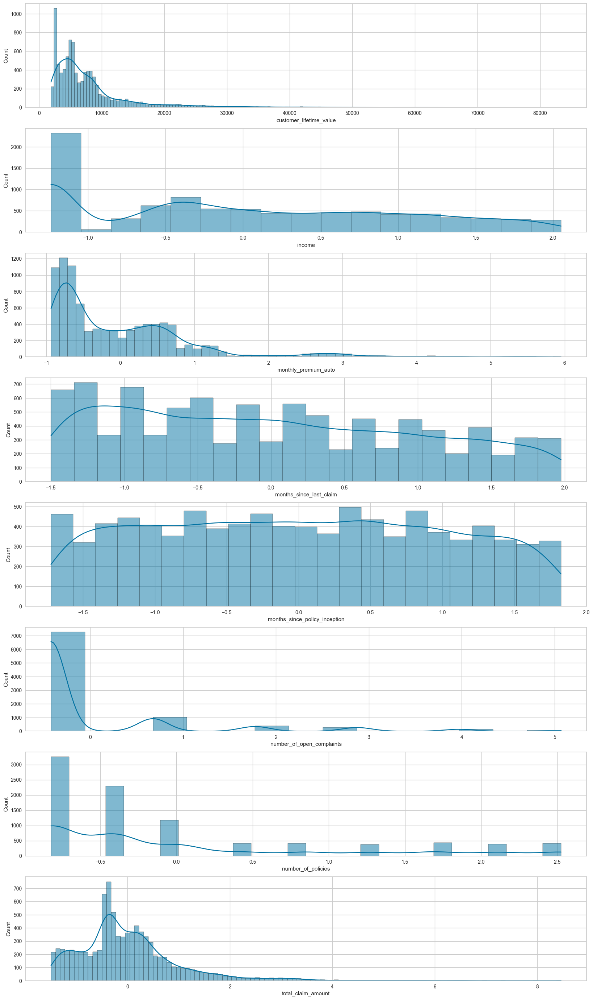

In [12]:
df_num = df.select_dtypes(include = np.number )

columnas = df_num.columns

fig, ax = plt.subplots(8,1, figsize = (20,35))

for i in range(len(columnas)):
    sns.histplot(df_num[columnas[i]], kde = True, ax = ax[i])
plt.show()

# Encoding 
## Tratamiento de No numericas

In [13]:
df.select_dtypes(exclude = np.number )


,customer,state,response,coverage,education,effective_to_date,employmentstatus,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
0,BU79786,Washington,No,Basic,Bachelor,2/24/11,Employed,F,Suburban,Married,Corporate Auto,Corporate L3,Offer1,Agent,Two-Door Car,Medsize
1,QZ44356,Arizona,No,Extended,Bachelor,1/31/11,Unemployed,F,Suburban,Single,Personal Auto,Personal L3,Offer3,Agent,Four-Door Car,Medsize
2,AI49188,Nevada,No,Premium,Bachelor,2/19/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Two-Door Car,Medsize
3,WW63253,California,No,Basic,Bachelor,1/20/11,Unemployed,M,Suburban,Married,Corporate Auto,Corporate L2,Offer1,Call Center,SUV,Medsize
4,HB64268,Washington,No,Basic,Bachelor,2/3/11,Employed,M,Rural,Single,Personal Auto,Personal L1,Offer1,Agent,Four-Door Car,Medsize
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,No,Basic,Bachelor,2/10/11,Employed,M,Urban,Married,Personal Auto,Personal L1,Offer2,Web,Four-Door Car,Medsize
9130,PK87824,California,Yes,Extended,College,2/12/11,Employed,F,Suburban,Divorced,Corporate Auto,Corporate L3,Offer1,Branch,Four-Door Car,Medsize
9131,TD14365,California,No,Extended,Bachelor,2/6/11,Unemployed,M,Suburban,Single,Corporate Auto,Corporate L2,Offer1,Branch,Four-Door Car,Medsize
9132,UP19263,California,No,Extended,College,2/3/11,Employed,M,Suburban,Married,Personal Auto,Personal L2,Offer3,Branch,Four-Door Car,Large


In [14]:
df.select_dtypes(exclude = np.number ).describe()   

,customer,state,response,coverage,education,effective_to_date,employmentstatus,gender,location_code,marital_status,policy_type,policy,renew_offer_type,sales_channel,vehicle_class,vehicle_size
count,9134,9134,9134,9134,9134,9134,9134,9134,9134,9134,9134,9134,9134,9134,9134,9134
unique,9134,5,2,3,5,59,5,2,3,3,3,9,4,4,6,3
top,BU79786,California,No,Basic,Bachelor,1/10/11,Employed,F,Suburban,Married,Personal Auto,Personal L3,Offer1,Agent,Four-Door Car,Medsize
freq,1,3150,7826,5568,2748,195,5698,4658,5779,5298,6788,3426,3752,3477,4621,6424


___
* ### Columna state

In [15]:
df['state'].unique()

array(['Washington', 'Arizona', 'Nevada', 'California', 'Oregon'],
      dtype=object)

> **Analisis de orden**

In [16]:
#hacemos un boxplot para ver la distribucion de los datos con un hue de state con px 
fig = px.box(df, y="customer_lifetime_value",  color="state")
fig.show()


Aprimera vista no parece que existan diferencias significativas entre los distintos valores de `states` para el `customer_lifetime_value`

> **Encoding**

In [17]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna state
df = sp.one_hot_encoder_one(df, 'state')
df

,customer,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington
0,BU79786,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,0.612827,Suburban,Married,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0
1,QZ44356,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,-1.239617,Suburban,Single,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0
2,AI49188,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,0.365710,Suburban,Married,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0
3,WW63253,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,-1.239617,Suburban,Married,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0
4,HB64268,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,0.203390,Rural,Single,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,No,Basic,Bachelor,2/10/11,Employed,M,1.128558,Urban,Married,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0
9130,PK87824,3096.511217,Yes,Extended,College,2/12/11,Employed,F,-0.528450,Suburban,Divorced,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0
9131,TD14365,8163.890428,No,Extended,Bachelor,2/6/11,Unemployed,M,-1.239617,Suburban,Single,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0
9132,UP19263,7524.442436,No,Extended,College,2/3/11,Employed,M,-0.517356,Suburban,Married,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0


___
- ### Columna coverage

In [18]:
df['coverage'].unique()

array(['Basic', 'Extended', 'Premium'], dtype=object)

> **Analisis de orden**

In [19]:
fig = px.box(df, y="customer_lifetime_value",  color="coverage")
fig.show()


In [20]:
# comparamaos las medias y desviacion de las coberturas con el customer_lifetime_value
df.groupby('coverage').agg({'customer_lifetime_value': ['mean', 'std','min','max']})

customer_lifetime_value                                       
                            mean          std          min          max
coverage                                                               
Basic                7190.706422  6142.352363  1898.007675  66025.75407
Extended             8789.677608  7427.222824  2376.533508  83325.38119
Premium             10895.603083  8370.764826  3173.032243  67907.27050

Teniendo en cuenta el grafico y la tabla comparativa obtaremos por otorgar orden a los valores de la columna `coverage` usanado un *OrdinalEncoding*. 

Establecemos el orden que queremos, de menos importante a más. Suponemos que las coverturas más caras son que tengan mayor valor en `customer_lifetime_value`. 

Seguiremos el siguiente orden: ['Basic', 'Extended', 'Premium']



> **Encoding**

In [21]:
orden = ['Basic', 'Extended', 'Premium']

df = sp.ordinal_encoder1(df, 'coverage', orden)
df.head()

,customer,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe
0,BU79786,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,0.612827,Suburban,Married,-0.703925,1.678099,-1.543287,-0.42225,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0
1,QZ44356,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,-1.239617,Suburban,Single,0.022691,-0.208186,-0.217334,-0.42225,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1
2,AI49188,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,0.365710,Suburban,Married,0.429596,0.288205,-0.360680,-0.42225,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2
3,WW63253,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,-1.239617,Suburban,Married,0.371467,0.288205,0.606907,-0.42225,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0
4,HB64268,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,0.203390,Rural,Single,-0.587666,-0.307465,-0.145661,-0.42225,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0


___
- ### Columna response

In [22]:
df['response'].unique()

array(['No', 'Yes'], dtype=object)

> **Analisis de orden**

In [23]:
fig = px.box(df, y="customer_lifetime_value",  color="response")
fig.show()


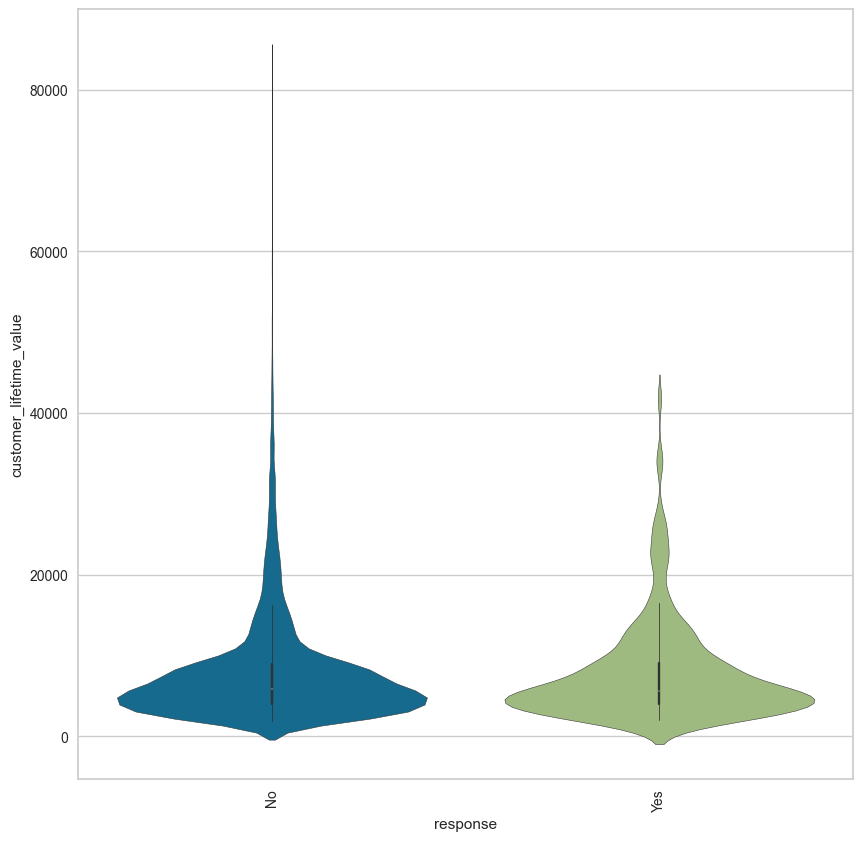

In [24]:
# hacemos otra grafuica con vilolinplot 
plt.figure(figsize=(10, 10))
sns.violinplot(data=df, x='response', y='customer_lifetime_value', hue='response')
plt.xticks(rotation=90)
plt.show()

No parecen tener ningun orden en `response` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [25]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'response')
df

,customer,customer_lifetime_value,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes
0,BU79786,2763.519279,Basic,Bachelor,2/24/11,Employed,F,0.612827,Suburban,Married,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0
1,QZ44356,6979.535903,Extended,Bachelor,1/31/11,Unemployed,F,-1.239617,Suburban,Single,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0
2,AI49188,12887.431650,Premium,Bachelor,2/19/11,Employed,F,0.365710,Suburban,Married,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0
3,WW63253,7645.861827,Basic,Bachelor,1/20/11,Unemployed,M,-1.239617,Suburban,Married,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0
4,HB64268,2813.692575,Basic,Bachelor,2/3/11,Employed,M,0.203390,Rural,Single,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,Bachelor,2/10/11,Employed,M,1.128558,Urban,Married,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0
9130,PK87824,3096.511217,Extended,College,2/12/11,Employed,F,-0.528450,Suburban,Divorced,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0
9131,TD14365,8163.890428,Extended,Bachelor,2/6/11,Unemployed,M,-1.239617,Suburban,Single,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0
9132,UP19263,7524.442436,Extended,College,2/3/11,Employed,M,-0.517356,Suburban,Married,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0


___
- ### Columna education

In [26]:
df['education'].unique()

array(['Bachelor', 'College', 'Master', 'High School or Below', 'Doctor'],
      dtype=object)

> **Analisis de orden**

In [27]:
fig = px.box(df, y="customer_lifetime_value",  color="education")
fig.show()


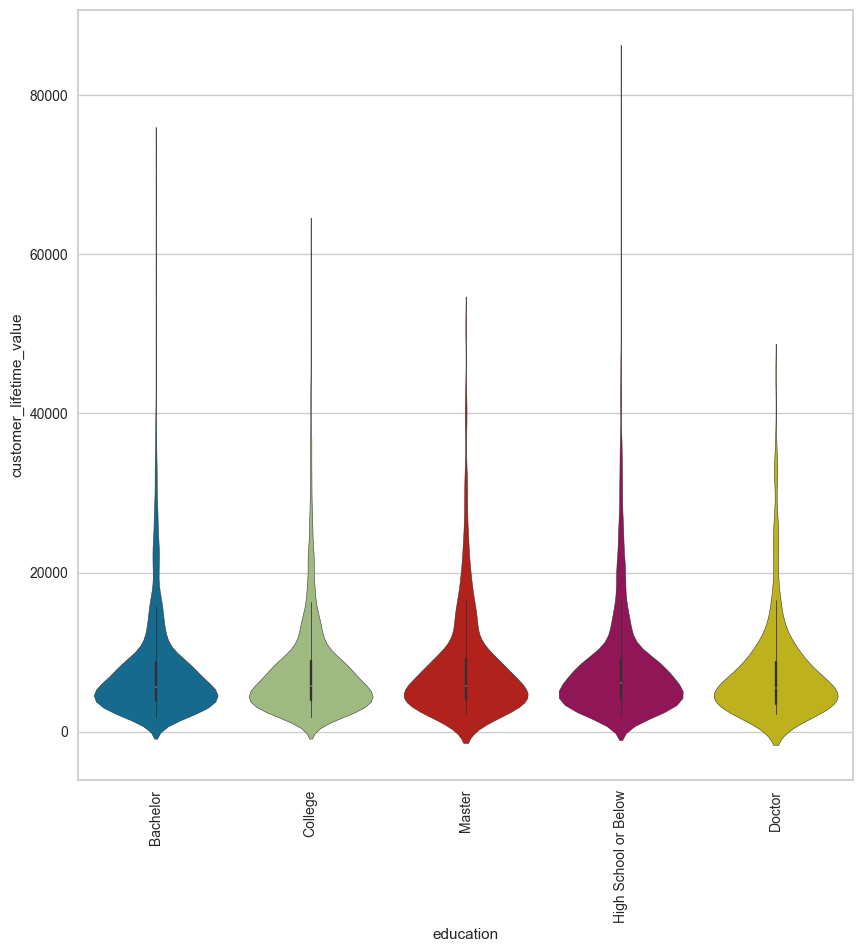

In [28]:
# hacemos otra grafuica con vilolinplot 
plt.figure(figsize=(10, 10))
sns.violinplot(data=df, x='education', y='customer_lifetime_value', hue='education')
plt.xticks(rotation=90)
plt.show()

In [29]:
df_estadisticas = df.groupby('education').agg({'customer_lifetime_value': ['mean', 'std','min','max']})

df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['mean', 'std', 'min', 'max'], color='#d65f5f')


,education,mean,std,min,max
0,Bachelor,7872.660412,6759.397589,1898.007675,73225.956520
1,College,7851.064644,6686.908165,1898.683686,61850.188030
2,Doctor,7520.344837,6267.986710,2267.604038,44856.113970
3,High School or Below,8296.709033,7220.572156,1940.981221,83325.381190
4,Master,8243.484692,6908.841255,2272.307310,51016.067040


No parecen tener ningun orden en `education` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [30]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'education')
df

,customer,customer_lifetime_value,coverage,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master
0,BU79786,2763.519279,Basic,2/24/11,Employed,F,0.612827,Suburban,Married,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,Unemployed,F,-1.239617,Suburban,Single,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0
2,AI49188,12887.431650,Premium,2/19/11,Employed,F,0.365710,Suburban,Married,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,Unemployed,M,-1.239617,Suburban,Married,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
4,HB64268,2813.692575,Basic,2/3/11,Employed,M,0.203390,Rural,Single,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,Employed,M,1.128558,Urban,Married,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0
9130,PK87824,3096.511217,Extended,2/12/11,Employed,F,-0.528450,Suburban,Divorced,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,Unemployed,M,-1.239617,Suburban,Single,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0
9132,UP19263,7524.442436,Extended,2/3/11,Employed,M,-0.517356,Suburban,Married,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0


___
- ### Columna employmentstatus

In [31]:
df['employmentstatus'].unique()

array(['Employed', 'Unemployed', 'Medical Leave', 'Disabled', 'Retired'],
      dtype=object)

> **Analisis de orden**

In [32]:
fig = px.box(df, y="customer_lifetime_value",  color="employmentstatus")
fig.show()


In [33]:
# comparamaos las medias y desviacion de las coberturas con el customer_lifetime_value
df_estadisticas = df.groupby('employmentstatus').agg({'customer_lifetime_value': ['mean', 'std','min','max']})

df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['mean', 'std', 'min', 'max'], color='#d65f5f') 


,employmentstatus,mean,std,min,max
0,Disabled,7847.889354,6443.495013,2119.894333,58207.128420
1,Employed,8219.117754,7067.107043,2255.312942,83325.381190
2,Medical Leave,7641.822437,6500.503154,2272.335352,43290.495430
3,Retired,7487.865141,5761.496790,2174.111987,30591.612570
4,Unemployed,7636.319761,6623.586963,1898.007675,74228.516040


No parecen tener ningun orden en `employmentstatus` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [34]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'employmentstatus')
df

,customer,customer_lifetime_value,coverage,effective_to_date,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed
0,BU79786,2763.519279,Basic,2/24/11,F,0.612827,Suburban,Married,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,F,-1.239617,Suburban,Single,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
2,AI49188,12887.431650,Premium,2/19/11,F,0.365710,Suburban,Married,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,M,-1.239617,Suburban,Married,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
4,HB64268,2813.692575,Basic,2/3/11,M,0.203390,Rural,Single,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,M,1.128558,Urban,Married,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9130,PK87824,3096.511217,Extended,2/12/11,F,-0.528450,Suburban,Divorced,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,M,-1.239617,Suburban,Single,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
9132,UP19263,7524.442436,Extended,2/3/11,M,-0.517356,Suburban,Married,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0


___
- ### Columna gender

In [35]:
df['gender'].unique()

array(['F', 'M'], dtype=object)

> **Analisis de orden**

In [36]:
fig = px.box(df, y="customer_lifetime_value",  color="gender")
fig.show()


In [37]:
# comparamaos las medias y desviacion de las coberturas con el customer_lifetime_value
df_estadisticas = df.groupby('gender').agg({'customer_lifetime_value': ['mean', 'std','min','max']})

df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['mean', 'std', 'min', 'max'], color='#d65f5f')


,gender,mean,std,min,max
0,F,8096.602370,6956.059575,1898.683686,73225.956520
1,M,7909.551488,6780.743219,1898.007675,83325.381190


No parecen tener ningun orden en `gender` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [38]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'gender')
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M
0,BU79786,2763.519279,Basic,2/24/11,0.612827,Suburban,Married,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,Suburban,Single,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,Suburban,Married,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,Suburban,Married,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,Rural,Single,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,Urban,Married,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,Suburban,Divorced,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,Suburban,Single,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,Suburban,Married,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0


___
- ### Columna location_code

In [39]:
df['location_code'].unique()

array(['Suburban', 'Rural', 'Urban'], dtype=object)

> **Analisis de orden**

In [40]:
fig = px.box(df, y="customer_lifetime_value",  color="location_code")
fig.show()

In [41]:
# comparamaos las medias y desviacion de las coberturas con el customer_lifetime_value
df_estadisticas = df.groupby('location_code').agg({'customer_lifetime_value': ['mean', 'std','min','max']})

df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['mean', 'std', 'min', 'max'], color='#d65f5f')


,location_code,mean,std,min,max
0,Rural,7953.699156,6595.473475,2124.173841,67907.270500
1,Suburban,8004.457415,6963.660977,1898.007675,83325.381190
2,Urban,8064.132929,6836.296074,2242.090803,51426.248150


No parecen tener ningun orden en `location_code` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [42]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'location_code')
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban
0,BU79786,2763.519279,Basic,2/24/11,0.612827,Married,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,Single,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,Married,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,Married,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,Single,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,Married,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,Divorced,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,Single,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,Married,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0


___
- ### Columna marital_status

In [43]:
df['marital_status'].unique()

array(['Married', 'Single', 'Divorced'], dtype=object)

> **Analisis de orden**

In [44]:
fig = px.box(df, y="customer_lifetime_value",  color="marital_status")
fig.show()

No parecen tener ningun orden en `marital_status` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [45]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'marital_status')
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0


___
- ### Columna policy_type

In [46]:
df['policy_type'].unique()

array(['Corporate Auto', 'Personal Auto', 'Special Auto'], dtype=object)

> **Analisis de orden**

In [47]:
fig = px.box(df, y="customer_lifetime_value",  color="policy_type")
fig.show()

In [48]:

df_estadisticas = df.groupby('policy_type').agg({'customer_lifetime_value': ['mean', 'std','min','max']})

df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['mean', 'std', 'min', 'max'], color='#d65f5f')


,policy_type,mean,std,min,max
0,Corporate Auto,7814.409552,6341.541776,2004.350666,61134.683070
1,Personal Auto,8027.363535,7010.790402,1898.007675,83325.381190
2,Special Auto,8594.245038,6961.873235,2004.350666,44795.469420


> **Encoding**

In [49]:
# lo primero que tenemos que hacer es crearnos un diccionario con el que mapearemos nuestra columna
## nos podemos preguntar como asignamos ese orden, le daremos los números más altos a aquellas categorías que sean más importantes, en este caso, a las casas que estén más cerca de
## la playa ya que serán las más caras

mapa = {'Personal Auto':0, 'Corporate Auto':0, 'Special Auto':1} 
df["policy_type_map"] = df["policy_type"].map(mapa)
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Personal L3,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Personal L3,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Corporate L2,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Personal L1,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Personal L1,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Corporate L3,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Corporate L2,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Personal L2,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0


___
- ### Columna policy

In [50]:
df['policy'].unique()

array(['Corporate L3', 'Personal L3', 'Corporate L2', 'Personal L1',
       'Special L2', 'Corporate L1', 'Personal L2', 'Special L1',
       'Special L3'], dtype=object)

> **Analisis de orden**

In [51]:
fig = px.box(df, y="customer_lifetime_value",  color="policy")
fig.show()

In [52]:
df_estadisticas = df.groupby('policy').agg({'customer_lifetime_value': ['mean', 'std','min','max','median']})


df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['median','mean', 'std', 'min', 'max'], color='#d65f5f')
df_estadisticas

,policy,mean,std,min,max,median
0,Corporate L1,8474.928216,7058.114377,2142.892273,46770.94705,6699.222525
1,Corporate L2,7597.695292,6039.770932,2127.923570,52811.49112,5595.835041
2,Corporate L3,7707.721963,6236.866715,2004.350666,61134.68307,5665.386954
3,Personal L1,7989.762020,7079.273848,1904.000852,74228.51604,5805.415020
4,Personal L2,8054.909341,6835.808347,1898.007675,58753.88046,5800.950475
5,Personal L3,8023.911602,7094.381969,1898.683686,83325.38119,5739.093180
6,Special L1,8332.763207,6242.117837,2227.072755,27890.05760,6175.406143
7,Special L2,8326.906361,6694.724748,2004.350666,38320.82017,6279.735986
8,Special L3,9007.091956,7555.977573,2305.056048,44795.46942,6516.654272


No parecen tener ningun orden en `policy` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [53]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'policy')
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Offer2,Web,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Offer1,Branch,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Offer1,Branch,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Offer3,Branch,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


___
- ### Columna renew_offer_type	

In [54]:
df.renew_offer_type.unique()

array(['Offer1', 'Offer3', 'Offer2', 'Offer4'], dtype=object)

> **Analisis de orden**

In [55]:
fig = px.box(df, y="customer_lifetime_value",  color="renew_offer_type")
fig.show()

In [56]:
df.renew_offer_type.unique()

array(['Offer1', 'Offer3', 'Offer2', 'Offer4'], dtype=object)

Teniendo en cuenta el grafico y optaremos por otorgar orden a los valores de la columna `renew_offer_type` usanado un *OrdinalEncoding*. 

Establecemos el orden que queremos, de menos importante a más. Suponemos que las renovaciones más caras son que tengan mayor valor en `customer_lifetime_value`. 

Seguiremos el siguiente orden: ['Offer4', 'Offer2', 'Offer3','Offer1]



> **Encoding**

In [57]:

orden = ['Offer4', 'Offer2', 'Offer3','Offer1']

df = sp.ordinal_encoder1(df, 'renew_offer_type', orden)
df.head()


,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.42225,-0.822648,Corporate Auto,Offer1,Agent,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.42225,2.106160,Personal Auto,Offer3,Agent,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.42225,-0.404247,Personal Auto,Offer1,Agent,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.42225,1.687759,Corporate Auto,Offer1,Call Center,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.42225,-0.822648,Personal Auto,Offer1,Agent,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3


___
- ### Columna sales_channel

In [58]:
df['sales_channel'].unique()

array(['Agent', 'Call Center', 'Web', 'Branch'], dtype=object)

> **Analisis de orden**

In [59]:
fig = px.box(df, y="customer_lifetime_value",  color="sales_channel")
fig.show()

No parecen tener ningun orden en `sales_channel` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [60]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'sales_channel')
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Offer1,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Offer3,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Offer1,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Offer1,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Offer1,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Offer2,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Offer1,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Offer1,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Offer3,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,1.

___
- ### Columna vehicle_class

In [61]:
df['vehicle_class'].unique()

array(['Two-Door Car', 'Four-Door Car', 'SUV', 'Luxury SUV', 'Sports Car',
       'Luxury Car'], dtype=object)

> **Analisis de orden**

In [62]:
fig = px.box(df, y="customer_lifetime_value",  color="vehicle_class")
fig.show()

In [63]:
df_estadisticas = df.groupby('vehicle_class').agg({'customer_lifetime_value': ['mean', 'std','min','max','median']})


df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['median','mean', 'std', 'min', 'max'], color='#d65f5f')


,vehicle_class,mean,std,min,max,median
0,Four-Door Car,6631.726607,5164.940720,1904.000852,41787.903430,5320.343098
1,Luxury Car,17053.348399,12542.357557,5886.221122,83325.381190,14510.443760
2,Luxury SUV,17122.999134,12671.874121,6383.611136,73225.956520,14395.515695
3,SUV,10443.511816,7939.857037,2864.820306,58753.880460,8592.585972
4,Sports Car,10750.989331,8462.333397,3074.105486,67907.270500,8554.788501
5,Two-Door Car,6671.030732,5163.894819,1898.007675,38887.903400,5266.700976


Parece existir algun tipo de orden entre los distintos tipos de la columna `vehicle_class`



In [64]:

mapa = {'Two-Door Car':0, 'Four-Door Car':0,
        'Sports Car':1, 'SUV':1,
        'Luxury Car':2, 'Luxury SUV':2,} 
df["vehicle_class_map"] = df["vehicle_class"].map(mapa)
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,total_claim_amount,vehicle_class,vehicle_size,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_map
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Offer1,-0.169640,Two-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Offer3,2.400737,Four-Door Car,Medsize,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0,0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Offer1,0.455734,Two-Door Car,Medsize,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Offer1,0.329769,SUV,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0,1
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Offer1,-1.018843,Four-Door Car,Medsize,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Offer2,-0.811934,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Offer1,-0.188956,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Offer1,1.227937,Four-Door Car,Medsize,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Offer3,0.885113,Four-Door Car,Large,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.

___
- ### Columna vehicle_size

In [65]:
df['vehicle_size'].unique()

array(['Medsize', 'Small', 'Large'], dtype=object)

> **Analisis de orden**

In [66]:
fig = px.box(df, y="customer_lifetime_value",  color="vehicle_size")
fig.show()

In [67]:
df_estadisticas = df.groupby('vehicle_size').agg({'customer_lifetime_value': ['mean', 'std','min','max','median']})


df_estadisticas.columns = df_estadisticas.columns.droplevel(0)
df_estadisticas.reset_index(inplace=True)
df_estadisticas.style.bar(subset=['median','mean', 'std', 'min', 'max'], color='#d65f5f')


,vehicle_size,mean,std,min,max,median
0,Large,7544.995730,6625.404119,1940.981221,60556.192130,5483.068552
1,Medsize,8050.661755,6833.096412,1898.007675,74228.516040,5844.520484
2,Small,8085.095932,7127.655003,1898.683686,83325.381190,5757.442258


No parecen tener ningun orden en `vehicle_size` por lo que optamos por One-Hot-Encoding 

> **Encoding**

In [68]:
# aplicamos nuestra función al dataset para que nos haga el encoding sobre la columna "plataforms
df = sp.one_hot_encoder_one(df, 'vehicle_size')
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,total_claim_amount,vehicle_class,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_map,vehicle_size_Large,vehicle_size_Medsize,vehicle_size_Small
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Offer1,-0.169640,Two-Door Car,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Offer3,2.400737,Four-Door Car,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Offer1,0.455734,Two-Door Car,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Offer1,0.329769,SUV,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0,1,0.0,1.0,0.0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Offer1,-1.018843,Four-Door Car,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Offer2,-0.811934,Four-Door Car,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Offer1,-0.188956,Four-Door Car,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Offer1,1.227937,Four-Door Car,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Offer3,0.885113,Four-Door Car,0.0,

In [69]:
df_num = df.select_dtypes(include = np.number )
df_num

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_map,vehicle_size_Large,vehicle_size_Medsize,vehicle_size_Small
0,2763.519279,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,-0.169640,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
1,6979.535903,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,2.400737,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
2,12887.431650,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,0.455734,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
3,7645.861827,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,0.329769,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0,1,0.0,1.0,0.0
4,2813.692575,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,-1.018843,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,23405.987980,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,-0.811934,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0
9130,3096.511217,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,-0.188956,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9131,8163.890428,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,1.227937,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9132,7524.442436,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,0.885113,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2,0.0,1.0,0.0,0.0,0,1.0,0.0,0.0


In [72]:
df_num.to_csv('../data/Customer_num.csv', index = False)

In [73]:
# guardamos el dataset en un archivo csv
df.to_csv('../data/Customers_preprocesado.csv', index=False)

In [74]:
df

,customer,customer_lifetime_value,coverage,effective_to_date,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,total_claim_amount,vehicle_class,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_map,vehicle_size_Large,vehicle_size_Medsize,vehicle_size_Small
0,BU79786,2763.519279,Basic,2/24/11,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Offer1,-0.169640,Two-Door Car,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
1,QZ44356,6979.535903,Extended,1/31/11,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Offer3,2.400737,Four-Door Car,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
2,AI49188,12887.431650,Premium,2/19/11,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Offer1,0.455734,Two-Door Car,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
3,WW63253,7645.861827,Basic,1/20/11,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Offer1,0.329769,SUV,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0,1,0.0,1.0,0.0
4,HB64268,2813.692575,Basic,2/3/11,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Offer1,-1.018843,Four-Door Car,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,23405.987980,Basic,2/10/11,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Offer2,-0.811934,Four-Door Car,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0
9130,PK87824,3096.511217,Extended,2/12/11,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Offer1,-0.188956,Four-Door Car,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9131,TD14365,8163.890428,Extended,2/6/11,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Offer1,1.227937,Four-Door Car,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9132,UP19263,7524.442436,Extended,2/3/11,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Offer3,0.885113,Four-Door Car,0.0,

In [3]:
# eliminamos las columnas que no nos interesan para hacer clusterizacion 
df.drop(columns=['customer', 'effective_to_date'], inplace=True)

KeyError: "['customer', 'effective_to_date'] not found in axis"

In [ ]:
df_num = df.select_dtypes(include = np.number )
df_num 

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_map,vehicle_size_Large,vehicle_size_Medsize,vehicle_size_Small
0,-0.762878,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,-0.169640,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
1,-0.149245,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,2.400737,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
2,0.710636,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,0.455734,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
3,-0.052263,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,0.329769,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0,1,0.0,1.0,0.0
4,-0.755575,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,-1.018843,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,2.241590,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,-0.811934,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0
9130,-0.714411,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,-0.188956,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9131,0.023135,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,1.227937,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0
9132,-0.069935,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,0.885113,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2,0.0,1.0,0.0,0.0,0,1.0,0.0,0.0


## Selección número de clusters

In [ ]:
# nos creamos una diccionario vacía para ir almacenando los valores de los scores del modelo
inercia = {}

# nos creamos una variable, que nos servirá para simular distintos números de clusters
clusters = range(1,11)

#iniciamos el for para crear distintos modelos de cluster para sacar los scores de cada uno
for i in clusters:
    kmeans = KMeans(n_clusters=i, random_state=0)
    kmeans.fit(df_num)
    
    inercia[i] = kmeans.inertia_

In [ ]:
inercias_results = pd.DataFrame(inercia, index = [0]).T.reset_index()
inercias_results.columns = ["num_clus", "inercia"]
# creamos una nueva columna con el incremento porcentual entre la incercia de un cluster y el siguiente a partir del segundo registro 
inercias_results['incremento'] = inercias_results['inercia'].pct_change().round(4)*100
 
inercias_results

,num_clus,inercia,incremento
0,1,143751.613313,NaN
1,2,130668.051481,-9.10
2,3,122224.073118,-6.46
3,4,117155.155878,-4.15
4,5,112921.159900,-3.61
5,6,107975.385997,-4.38
6,7,104826.848356,-2.92
7,8,102710.174557,-2.02
8,9,100856.883060,-1.80
9,10,98997.609778,-1.84


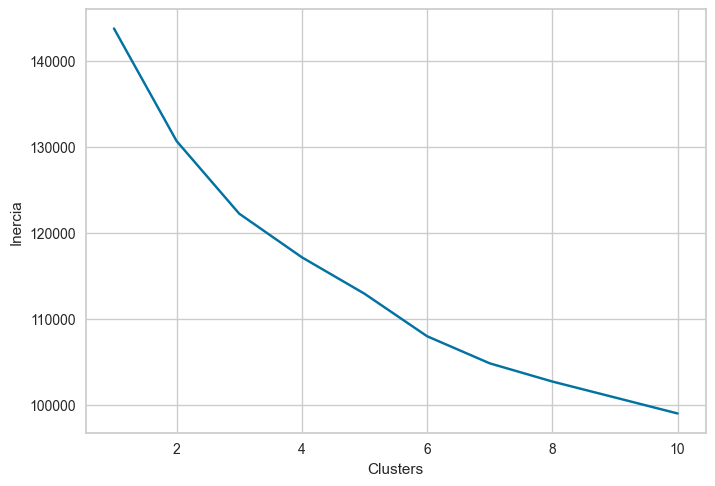

In [ ]:
#plotemoas los resultados
sns.lineplot(data=inercias_results, x="num_clus", y="inercia")

#cambiamos las etiquetas de los ejes
plt.xlabel('Clusters')
plt.ylabel('Inercia')
plt.show();

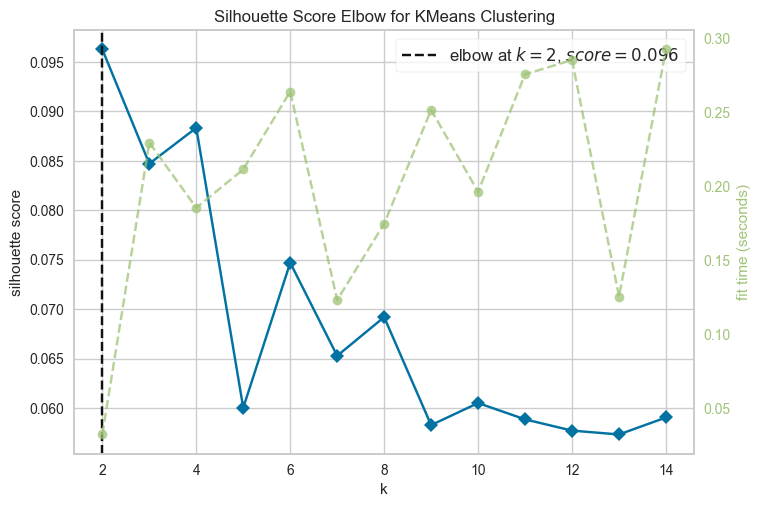

In [ ]:
# iniciamos un modelo de Kmean
model = KMeans()

# llamamos al método KElbowVisualizer para que nos calcula el score de silhouette
visualizer = KElbowVisualizer(model, k=(2,15), metric='silhouette')

# fiteamos el modelo
visualizer.fit(df_num)  

# visualizamos los resultados
visualizer.show();

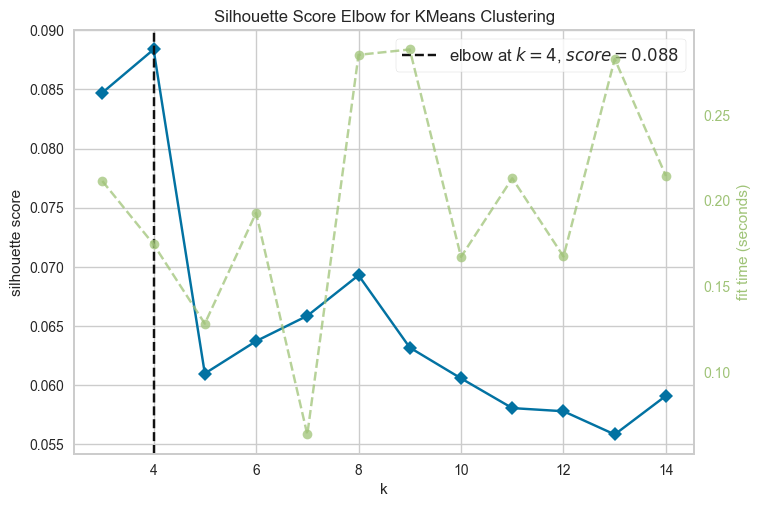

In [ ]:

# iniciamos un modelo de Kmean
model = KMeans()

# llamamos al método KElbowVisualizer para que nos calcula el score de silhouette
visualizer = KElbowVisualizer(model, k=(3,15), metric='silhouette')

# fiteamos el modelo
visualizer.fit(df_num)  

# visualizamos los resultados
visualizer.show();

Nos quedamos con 3dos cluster al obtener mejor puntuacion que con 3

### Ejecucion del modelo

In [ ]:
#iniciamos el modelo
kmeans = KMeans(n_clusters=4)

#fitemos el modelo
km_fit = kmeans.fit(df_num)

In [ ]:

# los clusters que se han generado
labels = km_fit.labels_
labels

array([2, 1, 2, ..., 1, 1, 1], dtype=int32)

In [ ]:
# los centros de nuestros clusters

centroides = km_fit.cluster_centers_
centroides

array([[ 1.65764902e+00, -1.65707960e-01,  2.28780188e+00,
         5.13847181e-02,  2.41893028e-02, -3.46284200e-02,
        -7.24677444e-02,  1.81275784e+00,  1.94010417e-01,
         3.45052083e-01,  9.24479167e-02,  2.85156250e-01,
         8.33333333e-02,  9.68750000e-01,  8.82812500e-01,
         1.17187500e-01,  2.86458333e-01,  2.60416667e-01,
         3.38541667e-02,  3.38541667e-01,  8.07291667e-02,
         5.98958333e-02,  6.09375000e-01,  3.77604167e-02,
         1.17187500e-02,  2.81250000e-01,  4.73958333e-01,
         5.26041667e-01,  6.64062500e-02,  8.22916667e-01,
         1.10677083e-01,  1.47135417e-01,  5.18229167e-01,
         3.34635417e-01,  3.51562500e-02,  4.16666667e-02,
         6.25000000e-02,  9.76562500e-02,  1.52343750e-01,
         2.21354167e-01,  3.89322917e-01,  3.90625000e-03,
         1.43229167e-02,  1.69270833e-02,  2.01302083e+00,
         3.77604167e-01,  2.57812500e-01,  2.04427083e-01,
         1.60156250e-01,  1.38541667e+00,  9.50520833e-0

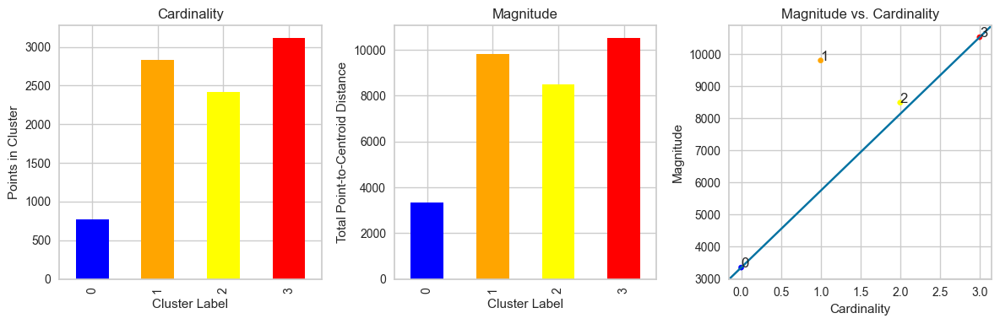

In [ ]:
# definimos los colores de las gráficas
cluster_colors = ['blue', 'orange', 'yellow', 'red',]

# iniciamos los subplots
fig, (ax1, ax2, ax3) = plt.subplots(1,3,figsize=(12,4))

# ploteamos la CARDINALIDAD
plot_cluster_cardinality(labels, # las labels que predijo nuestro modelo
                         ax=ax1, # sobre que eje lo queremos hacer
                         title="Cardinality", # título de la gráfica
                         color=cluster_colors # colores que vamos a querer usar
                        )


# ploteamos la MAGNITUD
plot_cluster_magnitude(df_num, # el dataframe del que sacaremos los datos
                       labels, # las labels que predijo nuestro modelo
                       centroides, # los centroides de nuestros clusters
                       euclidean, # la distancia que quiero usar para medir
                       ax=ax2,
                       title="Magnitude",
                       color=cluster_colors
                      )

# ploteamos la RELACIÓN ENTRE CARDINALIDAD Y MAGNITUD
plot_magnitude_vs_cardinality(df_num,# el dataframe del que sacaremos los datos
                              labels, # las labels que predijo nuestro modelo
                              centroides, # los centroides de nuestros clusters
                              euclidean,# la distancia
                              color=cluster_colors,
                              ax=ax3,
                              title="Magnitude vs. Cardinality")
plt.tight_layout()
plt.show()

### Entendiendo los clusters

In [ ]:
df_num["Cluster"] = labels
df_num

,customer_lifetime_value,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,total_claim_amount,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_map,vehicle_size_Large,vehicle_size_Medsize,vehicle_size_Small,Cluster
0,-0.762878,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,-0.169640,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,2
1,-0.149245,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,2.400737,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,1
2,0.710636,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,0.455734,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,2
3,-0.052263,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,0.329769,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0,1,0.0,1.0,0.0,1
4,-0.755575,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,-1.018843,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,2.241590,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,-0.811934,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,3
9130,-0.714411,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,-0.188956,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0,1
9131,0.023135,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,1.227937,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0,1
9132,-0.069935,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,0.885113,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2,0.0,1.0,0.0,0.0,0,1.0,0.0,0.0,1


In [ ]:
df

,customer_lifetime_value,coverage,income,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,renew_offer_type,total_claim_amount,vehicle_class,state_Arizona,state_California,state_Nevada,state_Oregon,state_Washington,coverage_oe,response_No,response_Yes,education_Bachelor,education_College,education_Doctor,education_High School or Below,education_Master,employmentstatus_Disabled,employmentstatus_Employed,employmentstatus_Medical Leave,employmentstatus_Retired,employmentstatus_Unemployed,gender_F,gender_M,location_code_Rural,location_code_Suburban,location_code_Urban,marital_status_Divorced,marital_status_Married,marital_status_Single,policy_type_map,policy_Corporate L1,policy_Corporate L2,policy_Corporate L3,policy_Personal L1,policy_Personal L2,policy_Personal L3,policy_Special L1,policy_Special L2,policy_Special L3,renew_offer_type_oe,sales_channel_Agent,sales_channel_Branch,sales_channel_Call Center,sales_channel_Web,vehicle_class_map,vehicle_size_Large,vehicle_size_Medsize,vehicle_size_Small,Cluster
0,-0.762878,Basic,0.612827,-0.703925,1.678099,-1.543287,-0.422250,-0.822648,Corporate Auto,Offer1,-0.169640,Two-Door Car,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,2
1,-0.149245,Extended,-1.239617,0.022691,-0.208186,-0.217334,-0.422250,2.106160,Personal Auto,Offer3,2.400737,Four-Door Car,1.0,0.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,2,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,1
2,0.710636,Premium,0.365710,0.429596,0.288205,-0.360680,-0.422250,-0.404247,Personal Auto,Offer1,0.455734,Two-Door Car,0.0,0.0,1.0,0.0,0.0,2,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,2
3,-0.052263,Basic,-1.239617,0.371467,0.288205,0.606907,-0.422250,1.687759,Corporate Auto,Offer1,0.329769,SUV,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,0.0,1.0,0.0,1,0.0,1.0,0.0,1
4,-0.755575,Basic,0.203390,-0.587666,-0.307465,-0.145661,-0.422250,-0.822648,Personal Auto,Offer1,-1.018843,Four-Door Car,0.0,0.0,0.0,0.0,1.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,3,1.0,0.0,0.0,0.0,0,0.0,1.0,0.0,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,2.241590,Basic,1.128558,-0.587666,0.288205,1.466984,-0.422250,-0.404247,Personal Auto,Offer2,-0.811934,Four-Door Car,0.0,1.0,0.0,0.0,0.0,0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,3
9130,-0.714411,Extended,-0.528450,-0.413278,-0.108908,-0.719046,-0.422250,-0.822648,Corporate Auto,Offer1,-0.188956,Four-Door Car,0.0,1.0,0.0,0.0,0.0,1,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0,1
9131,0.023135,Extended,-1.239617,-0.238891,-0.605299,-0.396517,2.873245,-0.404247,Corporate Auto,Offer1,1.227937,Four-Door Car,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3,0.0,1.0,0.0,0.0,0,0.0,1.0,0.0,1
9132,-0.069935,Extended,-0.517356,0.080820,1.876656,-1.614960,-0.422250,0.014154,Personal Auto,Offer3,0.885113,Four-Door Car,0.0,1.0,0.0,0.0,0.0,1,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,2,0.0,1.0,0.0,0.0,0,1.0,0.0,0.0,1


In [ ]:
df_final = pd.read_csv('data/Customers.csv') # leemos el archivo csv

df_final.columns=[e.lower().replace(' ', '_') for e in df_final.columns]

#df.reset_index(inplace=True)

df_final.head()

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize


In [ ]:
df_final['Cluster'] = labels
df_final

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,Cluster
0,BU79786,Washington,2763.519279,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.811147,Two-Door Car,Medsize,2
1,QZ44356,Arizona,6979.535903,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.464935,Four-Door Car,Medsize,1
2,AI49188,Nevada,12887.431650,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.472247,Two-Door Car,Medsize,2
3,WW63253,California,7645.861827,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.881344,SUV,Medsize,1
4,HB64268,Washington,2813.692575,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.130879,Four-Door Car,Medsize,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,23405.987980,No,Basic,Bachelor,2/10/11,Employed,M,71941,Urban,Married,73,18,89,0,2,Personal Auto,Personal L1,Offer2,Web,198.234764,Four-Door Car,Medsize,3
9130,PK87824,California,3096.511217,Yes,Extended,College,2/12/11,Employed,F,21604,Suburban,Divorced,79,14,28,0,1,Corporate Auto,Corporate L3,Offer1,Branch,379.200000,Four-Door Car,Medsize,1
9131,TD14365,California,8163.890428,No,Extended,Bachelor,2/6/11,Unemployed,M,0,Suburban,Single,85,9,37,3,2,Corporate Auto,Corporate L2,Offer1,Branch,790.784983,Four-Door Car,Medsize,1
9132,UP19263,California,7524.442436,No,Extended,College,2/3/11,Employed,M,21941,Suburban,Married,96,34,3,0,3,Personal Auto,Personal L2,Offer3,Branch,691.200000,Four-Door Car,Large,1


In [ ]:
for i in df_final.columns:
    print(i)
    fig = px.box(df_final, y=i,  color="Cluster")
    fig.show()
    

customer


state


customer_lifetime_value


response


coverage


education


effective_to_date


employmentstatus


gender


income


location_code


marital_status


monthly_premium_auto


months_since_last_claim


months_since_policy_inception


number_of_open_complaints


number_of_policies


policy_type


policy


renew_offer_type


sales_channel


total_claim_amount


vehicle_class


vehicle_size


Cluster


In [ ]:
df_final['customer_lifetime_value'] = df_final['customer_lifetime_value'].round(2)
df_final['total_claim_amount'] = df_final['total_claim_amount'].round(2)

In [ ]:
df_final

,customer,state,customer_lifetime_value,response,coverage,education,effective_to_date,employmentstatus,gender,income,location_code,marital_status,monthly_premium_auto,months_since_last_claim,months_since_policy_inception,number_of_open_complaints,number_of_policies,policy_type,policy,renew_offer_type,sales_channel,total_claim_amount,vehicle_class,vehicle_size,Cluster
0,BU79786,Washington,2763.52,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.81,Two-Door Car,Medsize,2
1,QZ44356,Arizona,6979.54,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.46,Four-Door Car,Medsize,1
2,AI49188,Nevada,12887.43,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.47,Two-Door Car,Medsize,2
3,WW63253,California,7645.86,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.88,SUV,Medsize,1
4,HB64268,Washington,2813.69,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.13,Four-Door Car,Medsize,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,LA72316,California,23405.99,No,Basic,Bachelor,2/10/11,Employed,M,71941,Urban,Married,73,18,89,0,2,Personal Auto,Personal L1,Offer2,Web,198.23,Four-Door Car,Medsize,3
9130,PK87824,California,3096.51,Yes,Extended,College,2/12/11,Employed,F,21604,Suburban,Divorced,79,14,28,0,1,Corporate Auto,Corporate L3,Offer1,Branch,379.20,Four-Door Car,Medsize,1
9131,TD14365,California,8163.89,No,Extended,Bachelor,2/6/11,Unemployed,M,0,Suburban,Single,85,9,37,3,2,Corporate Auto,Corporate L2,Offer1,Branch,790.78,Four-Door Car,Medsize,1
9132,UP19263,California,7524.44,No,Extended,College,2/3/11,Employed,M,21941,Suburban,Married,96,34,3,0,3,Personal Auto,Personal L2,Offer3,Branch,691.20,Four-Door Car,Large,1


In [ ]:
df_final.reset_index(inplace=True)
df_final.rename(columns={'index':'id'}, inplace=True)

In [ ]:
df_final.to_csv('../data/Customers_cluster_weekend.csv', index=False)

In [22]:
df1 = pd.read_csv('../data/Customers_cluster_weekend.csv')
df1.rename(columns={'Cluster':'Cient Type '}, inplace=True)

In [23]:
df1.columns[1:-1]

Index(['customer', 'state', 'customer_lifetime_value', 'response', 'coverage',
       'education', 'effective_to_date', 'employmentstatus', 'gender',
       'income', 'location_code', 'marital_status', 'monthly_premium_auto',
       'months_since_last_claim', 'months_since_policy_inception',
       'number_of_open_complaints', 'number_of_policies', 'policy_type',
       'policy', 'renew_offer_type', 'sales_channel', 'total_claim_amount',
       'vehicle_class', 'vehicle_size'],
      dtype='object')

In [24]:
df.columns

Index(['Customer', 'State', 'Customer Lifetime Value', 'Response', 'Coverage',
       'Education', 'Effective To Date', 'EmploymentStatus', 'Gender',
       'Income', 'Location Code', 'Marital Status', 'Monthly Premium Auto',
       'Months Since Last Claim', 'Months Since Policy Inception',
       'Number of Open Complaints', 'Number of Policies', 'Policy Type',
       'Policy', 'Renew Offer Type', 'Sales Channel', 'Total Claim Amount',
       'Vehicle Class', 'Vehicle Size'],
      dtype='object')

In [25]:
atiguo = list(df1.columns[1:-1])
nuevo = list(df.columns)
dicc = dict(zip(atiguo, nuevo))
dicc

{'customer': 'Customer',
 'state': 'State',
 'customer_lifetime_value': 'Customer Lifetime Value',
 'response': 'Response',
 'coverage': 'Coverage',
 'education': 'Education',
 'effective_to_date': 'Effective To Date',
 'employmentstatus': 'EmploymentStatus',
 'gender': 'Gender',
 'income': 'Income',
 'location_code': 'Location Code',
 'marital_status': 'Marital Status',
 'monthly_premium_auto': 'Monthly Premium Auto',
 'months_since_last_claim': 'Months Since Last Claim',
 'months_since_policy_inception': 'Months Since Policy Inception',
 'number_of_open_complaints': 'Number of Open Complaints',
 'number_of_policies': 'Number of Policies',
 'policy_type': 'Policy Type',
 'policy': 'Policy',
 'renew_offer_type': 'Renew Offer Type',
 'sales_channel': 'Sales Channel',
 'total_claim_amount': 'Total Claim Amount',
 'vehicle_class': 'Vehicle Class',
 'vehicle_size': 'Vehicle Size'}

In [26]:
df1.rename(columns=dicc, inplace=True)
df1

,id,Customer,State,Customer Lifetime Value,Response,Coverage,Education,Effective To Date,EmploymentStatus,Gender,Income,Location Code,Marital Status,Monthly Premium Auto,Months Since Last Claim,Months Since Policy Inception,Number of Open Complaints,Number of Policies,Policy Type,Policy,Renew Offer Type,Sales Channel,Total Claim Amount,Vehicle Class,Vehicle Size,Cient Type
0,0,BU79786,Washington,2763.52,No,Basic,Bachelor,2/24/11,Employed,F,56274,Suburban,Married,69,32,5,0,1,Corporate Auto,Corporate L3,Offer1,Agent,384.81,Two-Door Car,Medsize,2
1,1,QZ44356,Arizona,6979.54,No,Extended,Bachelor,1/31/11,Unemployed,F,0,Suburban,Single,94,13,42,0,8,Personal Auto,Personal L3,Offer3,Agent,1131.46,Four-Door Car,Medsize,1
2,2,AI49188,Nevada,12887.43,No,Premium,Bachelor,2/19/11,Employed,F,48767,Suburban,Married,108,18,38,0,2,Personal Auto,Personal L3,Offer1,Agent,566.47,Two-Door Car,Medsize,2
3,3,WW63253,California,7645.86,No,Basic,Bachelor,1/20/11,Unemployed,M,0,Suburban,Married,106,18,65,0,7,Corporate Auto,Corporate L2,Offer1,Call Center,529.88,SUV,Medsize,1
4,4,HB64268,Washington,2813.69,No,Basic,Bachelor,2/3/11,Employed,M,43836,Rural,Single,73,12,44,0,1,Personal Auto,Personal L1,Offer1,Agent,138.13,Four-Door Car,Medsize,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9129,9129,LA72316,California,23405.99,No,Basic,Bachelor,2/10/11,Employed,M,71941,Urban,Married,73,18,89,0,2,Personal Auto,Personal L1,Offer2,Web,198.23,Four-Door Car,Medsize,3
9130,9130,PK87824,California,3096.51,Yes,Extended,College,2/12/11,Employed,F,21604,Suburban,Divorced,79,14,28,0,1,Corporate Auto,Corporate L3,Offer1,Branch,379.20,Four-Door Car,Medsize,1
9131,9131,TD14365,California,8163.89,No,Extended,Bachelor,2/6/11,Unemployed,M,0,Suburban,Single,85,9,37,3,2,Corporate Auto,Corporate L2,Offer1,Branch,790.78,Four-Door Car,Medsize,1
9132,9132,UP19263,California,7524.44,No,Extended,College,2/3/11,Employed,M,21941,Suburban,Married,96,34,3,0,3,Personal Auto,Personal L2,Offer3,Branch,691.20,Four-Door Car,Large,1


In [27]:
df1.to_csv('../data/Customers_prime_weekend.csv', index=False)